# Przetwarzanie wstępne. Filtracja kontekstowa.


### Cel:
- zapoznanie z pojęciem kontekstu / filtracji kontekstowej,
- zapoznanie z pojęciem konwolucji (splotu),
- zapoznanie z wybranymi filtrami:
	- filtry liniowe dolnoprzepustowe:
		- filtr uśredniający,
		- filtr Gaussa.
	- filtry nielinowe:
		- mediana,
		- mediana dla obrazów kolorowych.
	- filtry liniowe górnoprzepustowe:
			- laplasjan,
			- operator Robersta, Prewitta, Sobela.
- zadanie domowe: adaptacyjna filtracja medianowa.

### Filtry liniowe uśredniające (dolnoprzepustowe)

Jest to podstawowa rodzina filtrów stosowana w cyfrowym przetwarzaniu obrazów.
Wykorzystuje się je w celu "rozmazania" obrazu i tym samym redukcji szumów (zakłóceń) na obrazie.
Filtr określony jest przez dwa parametry: rozmiar maski (ang. _kernel_) oraz wartości współczynników maski.

Warto zwrócić uwagę, że omawiane w niniejszym rozdziale operacje generują nową wartość piksela na podstawie pewnego fragmentu obrazu (tj. kontekstu), a nie jak operacje punktowe tylko na podstawie jednego piksela.


1. Wczytaj obraz _plansza.png_.
W dalszej części ćwiczenia sprawdzenie działania filtracji dla innych obrazów sprowadzi się do wczytania innego pliku.

2. Podstawowa funkcja to `cv2.filter2D`  - realizacja filtracji konwolucyjnej.
   Proszę sprawdzić jej dokumentację i zwrócić uwagę na obsługę problemu brzegowego (na krawędziach istnieją piksele dla których nie da się wyznaczyć otoczenia).

  Uwaga. Problem ten można też rozwiązać z użyciem funkcji `signal.convolve2d` z biblioteki _scipy_ (`from scipy import signal`).

3. Stwórz podstawowy filtr uśredniający o rozmiarze $3 \times 3$ -- za pomocą funkcji `np.ones`. Wykonaj konwolucję na wczytanym obrazie. Na wspólnym rysunku wyświetl obraz oryginalny, po filtracji oraz moduł z różnicy.

4. Przeanalizuj otrzymane wyniki. Jakie elementy zawiera obraz "moduł z różnicy"? Co na tej podstawie można powiedzieć o filtracji dolnoprzepustowej?

In [ ]:
import cv2
import os
import requests
from matplotlib import pyplot as plt
import numpy as np
from scipy import signal

url = 'https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/'

fileNames = ["jet.png", "kw.png", "moon.png", "lenaSzum.png", "lena.png", "plansza.png"]
for fileName in fileNames:
  if not os.path.exists(fileName):
      r = requests.get(url + fileName, allow_redirects=True)
      open(fileName, 'wb').write(r.content)



Stwórz podstawowy filtr uśredniający o rozmiarze  3×3  -- za pomocą funkcji np.ones. Wykonaj konwolucję na wczytanym obrazie. Na wspólnym rysunku wyświetl obraz oryginalny, po filtracji oraz moduł z różnicy.

Text(0.5, 1.0, 'difference')

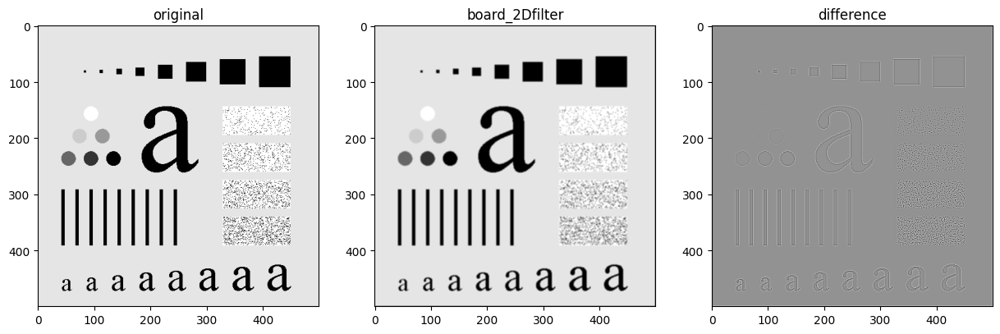

In [ ]:
board = cv2.imread("plansza.png", cv2.IMREAD_GRAYSCALE)
board_2Dfilter = signal.convolve2d(board, np.ones((3, 3)) / 9, mode="same")
board_diff = board - board_2Dfilter
fig, axs = plt.subplots(1, 3, figsize=(15, 15))
axs[0].imshow(board, "gray")
axs[0].set_title("original")
axs[1].imshow(board_2Dfilter, "gray")
axs[1].set_title("board_2Dfilter")
axs[2].imshow(board_diff, "gray")
axs[2].set_title("difference")

Przeanalizuj otrzymane wyniki. Jakie elementy zawiera obraz "moduł z różnicy"? Co na tej podstawie można powiedzieć o filtracji dolnoprzepustowej?

Filtracja dolnoprzepustowa skutecznie usuwa szum i drobne detale obrazu, zachowując główne struktury.
Obraz różnicy wskazuje na obszary, w których usunięto te detale.

Filtr dolnoprzepustowy (tutaj uśredniający o rozmiarze 3×3) redukuje wysokoczęstotliwościowe elementy obrazu, takie jak szum i krawędzie, wygładzając obraz.

5. Na wspólnym rysunku wyświetl wyniki filtracji uśredniającej z oknem o rozmiarze 3, 5, 9, 15 i 35.
Wykorzystaj polecenie `plt.subplot`.
Przeanalizuj wpływ rozmiaru maski na wynik.

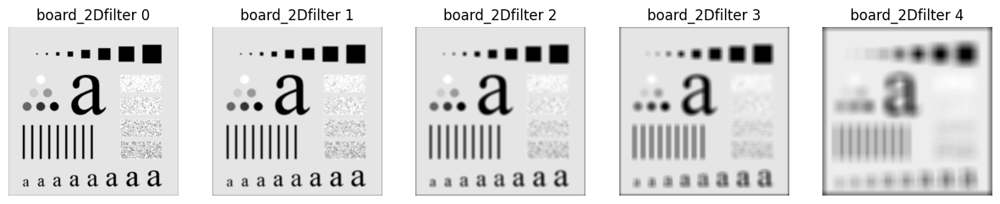

In [ ]:
board_2DFilter_list = [
    # Tworzenie listy obrazów po zastosowaniu 2D filtra za pomocą konwolucji.
    signal.convolve2d(board, np.ones((i, i)) / (i * i), mode="same")
    for i in [3, 5, 9, 15, 35]
]


fig, axs = plt.subplots(1, 5, figsize=(15, 15))
for i in range(5):
    axs[i].imshow(board_2DFilter_list[i], "gray")
    axs[i].set_title(f"board_2Dfilter {i}")
    axs[i].axis("off")


6. Wczytaj obraz _lena.png_.
Zaobserwuj efekty filtracji dolnoprzepustowej dla obrazu rzeczywistego.

Text(0.5, 1.0, 'original - lena_2Dfilter')

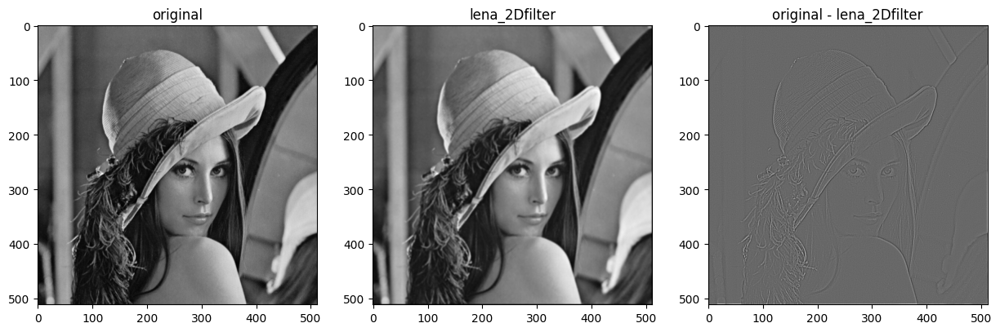

In [ ]:
lena = cv2.imread("lena.png", cv2.IMREAD_GRAYSCALE)

# Wykonanie 2D konwolucji obrazu z filtrem uśredniającym o wymiarach 3x3
# Filtr ma wartości równe 1/9, co zapewnia równomierne uśrednianie pikseli w oknie 3x3
lena_2DFilter = signal.convolve2d(lena, np.ones((3, 3)) / 9, mode="same")

# Tworzenie obszaru do wizualizacji wyników
fig, axs = plt.subplots(1, 3, figsize=(15, 15))
axs[0].imshow(lena, "gray")
axs[0].set_title("original")
axs[1].imshow(lena_2DFilter, "gray")
axs[1].set_title("lena_2Dfilter")
axs[2].imshow(lena - lena_2DFilter, "gray")
axs[2].set_title("original - lena_2Dfilter")


7. Niekorzystny efekt towarzyszący wykonanym filtracjom dolnoprzepustowym to utrata ostrości.
Częściowo można go zniwelować poprzez odpowiedni dobór maski.
Wykorzystaj maskę:  `M = np.array([1 2 1; 2 4 2; 1 2 1])`.
Przed obliczeniami należy jeszcze wykonać normalizację - podzielić każdy element maski przez sumę wszystkich elementów: `M = M/sum(sum(M));`.
Tak przygotowaną maskę wykorzystaj w konwolucji - wyświetl wyniki tak jak wcześniej.
Możliwe jest też wykorzystywanie innych masek - współczynniki można dopasowywać do konkretnego problemu.

Text(0.5, 1.0, 'lena_2Dfilter with Mask')

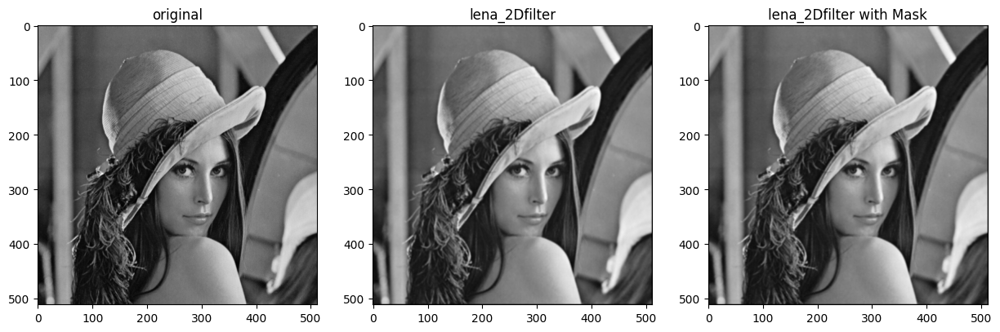

In [ ]:
M = np.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]])
M = M / sum(M) # normalizacja

lena_2DFilterMask = signal.convolve2d(lena, M, mode="same")
fig, axs = plt.subplots(1, 3, figsize=(15, 15))
axs[0].imshow(lena, "gray")
axs[0].set_title("original")
axs[1].imshow(lena_2DFilter, "gray")
axs[1].set_title("lena_2Dfilter")
axs[2].imshow(lena_2DFilterMask, "gray")
axs[2].set_title("lena_2Dfilter with Mask")

8. Skuteczną i często wykorzystywaną maską jest tzw. maska Gasussa.
Jest to zbiór liczb, które aproksymują dwuwymiarowy rozkład Gaussa.
Parametrem jest odchylenie standardowe i rozmiar maski.

9. Wykorzystując przygotowaną funkcję `fgaussian` stwórz maskę o rozmiarze $5 \times 5$ i odchyleniu standardowym 0.5.
  Wykorzystując funkcję `mesh` zwizualizuj filtr.
  Sprawdź jak parametr ``odchylenie standardowe'' wpływa na ``kształt'' filtru.

  Uwaga. W OpenCV dostępna jest *dedykowana* funkcja do filtracji Gaussa - `GaussianBlur`.
  Proszę na jednym przykładzie porównać jej działanie z użytym wyżej rozwiązaniem.

10. Wykonaj filtrację dla wybranych (2--3) wartości odchylenia standardowego.


**fgaussian**: Generowanie masek do filtrów wygładzających, wykorzystywanych np. w usuwaniu szumu, rozmywaniu lub przygotowywaniu danych do analizy.

**mesh**: Wizualizacja masek, która pozwala zobaczyć ich strukturę i zrozumieć, jak wpływają na obraz podczas konwolucji.

In [ ]:
import numpy as np
from matplotlib import pyplot as plt

In [ ]:
def fgaussian(size, sigma): #size - rozmiar maski sigma - odchylenie standardowe . Im większe tym bardziej rozmyty filtr
    m = n = size
    h, k = m // 2, n // 2
    x, y = np.mgrid[-h : h + 1, -k : k + 1]
    g = np.exp(-(x**2 + y**2) / (2 * sigma**2))
    return g / g.sum()


def mesh(fun, size): #fun - gotowa macierz reprezentująca maskę, size - rozmiar siatki
    fig = plt.figure()
    ax = fig.add_subplot(projection="3d")

    X = np.arange(-size // 2, size // 2, 1)
    Y = np.arange(-size // 2, size // 2, 1)
    X, Y = np.meshgrid(X, Y)
    Z = fun
    ax.plot_surface(X, Y, Z)
    plt.show()

stwórz maskę o rozmiarze  5×5  i odchyleniu standardowym 0.5.

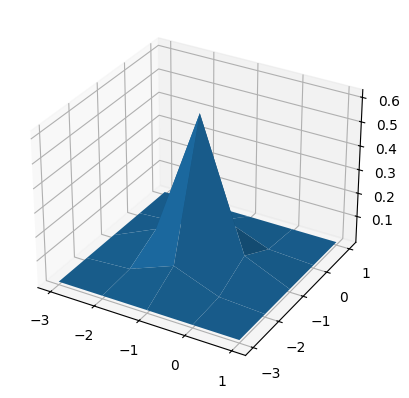

In [ ]:
mesh(fgaussian(5, 0.5), 5)

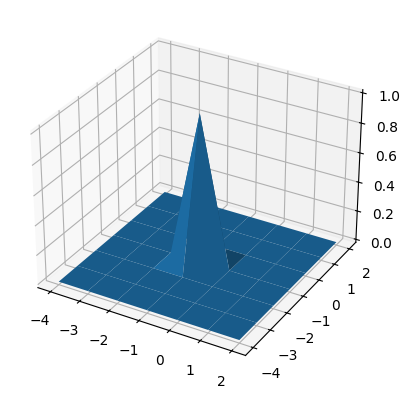

In [ ]:
mesh(fgaussian(7, 0.1), 7)

### Filtry nieliniowe -- mediana

Filtry rozmywające redukują szum, ale niekorzystnie wpływają na ostrość obrazu.
Dlatego często wykorzystuje się filtry nieliniowe - np. filtr medianowy (dla przypomnienia: mediana - środkowa wartość w posortowanym ciągu liczb).

Podstawowa różnica pomiędzy filtrami liniowymi, a nieliniowymi polega na tym, że przy filtracji liniowej na nową wartość piksela ma wpływ wartość wszystkich pikseli z otoczenia (np. uśrednianie, czasem ważone), natomiast w przypadku filtracji nieliniowej jako nowy piksel wybierana jest któraś z wartości otoczenia - według jakiegoś wskaźnika (wartość największa, najmniejsza czy właśnie mediana).


1. Wczytaj obraz _lenaSzum.png_ (losowe 10% pikseli białych lub czarnych - tzw. zakłócenia impulsowe). Przeprowadź filtrację uśredniającą z rozmiarem maski 3x3. Wyświetl, podobnie jak wcześniej, oryginał, wynik filtracji i moduł z różnicy. Wykorzystując funkcję ``cv2.medianBlur` wykonaj filtrację medianową _lenaSzum.png_ (z rozmiarem maski $3 \times 3$). Wyświetl, podobnie jak wcześniej, oryginał, wynik filtracji i moduł z różnicy. Która filtracja lepiej radzi sobie z tego typu szumem?

  Uwaga. Taki sam efekt da również użycie funkcji `signal.medfilt2d`.


2. Przeprowadź filtrację uśredniającą, a następnie medianową obrazu lena.png. Wyniki porównaj - dla obu wyświetl: oryginał, wynik filtracji i moduł z różnicy. Szczególną uwagę zwróć na ostrość i krawędzie. W której filtracji krawędzie zostają lepiej zachowane?

Text(0.5, 1.0, 'difference')

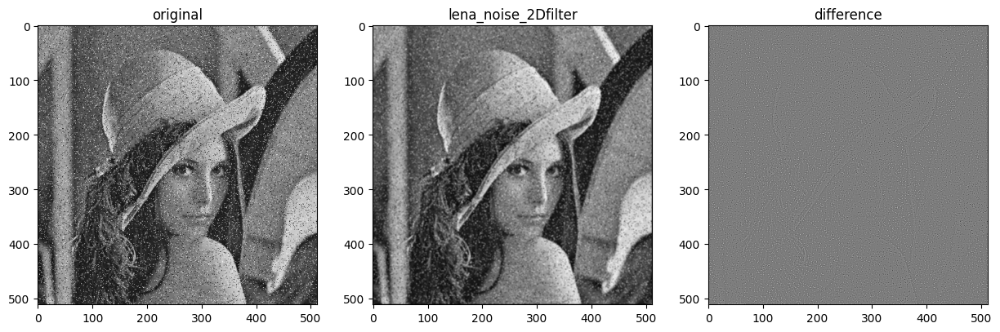

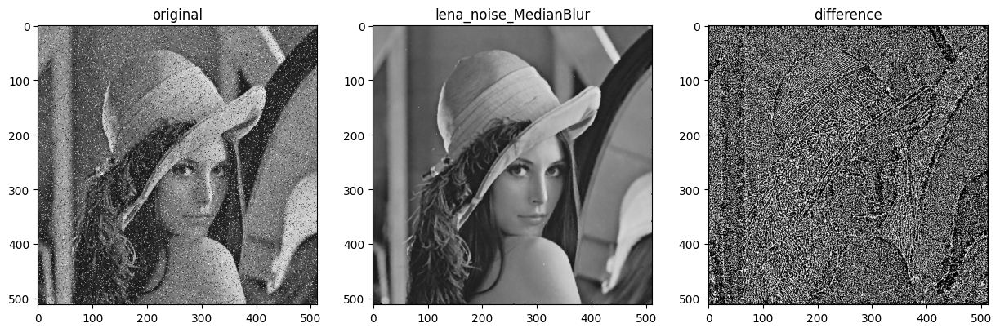

In [ ]:
lena_noise = cv2.imread("lenaSzum.png", cv2.IMREAD_GRAYSCALE)
lena_noise_2DFilter = signal.convolve2d(lena_noise, np.ones((3, 3)) / 9, mode="same")

# Plot liniowy
fig, axs = plt.subplots(1, 3, figsize=(15, 15))
axs[0].imshow(lena_noise, "gray")
axs[0].set_title("original")
axs[1].imshow(lena_noise_2DFilter, "gray")
axs[1].set_title("lena_noise_2Dfilter")
axs[2].imshow(lena_noise - lena_noise_2DFilter, "gray")
axs[2].set_title("difference")


# Median Blur (nieliniowy)
lena_noise_MedianBlur = signal.medfilt2d(lena_noise, kernel_size=3)

fig, axs = plt.subplots(1, 3, figsize=(15, 15))
axs[0].imshow(lena_noise, "gray")
axs[0].set_title("original")
axs[1].imshow(lena_noise_MedianBlur, "gray")
axs[1].set_title("lena_noise_MedianBlur")
axs[2].imshow(lena_noise - lena_noise_MedianBlur, "gray")
axs[2].set_title("difference")

Która filtracja lepiej radzi sobie z tego typu szumem? - Nielinowa

Filtracja medianowa lepiej zachowuje krawędzie obrazu, w przeciwieństwie do filtracji średniej, która powoduje ich wygładzenie. Filtracja medianowa jest bardziej skuteczna w usuwaniu szumów, jednocześnie minimalizując zatarcie detali w obrazie, w tym krawędzi.








3. Ciekawy efekt można uzyskać wykonując filtrację medianową wielokrotnie. Określa się go mianem  posteryzacji.  W wyniku przetwarzania z obrazka usunięte zostają detale, a duże obszary uzyskują tą samą wartość jasności.  Wykonaj operację mediany $5 \times 5$ na obrazie _lena.png_ 10-krotnie. (wykorzystaj np. pętlę `for`).


Inne filtry nieliniowe:
- filtr modowy - moda (dominanta) zamiast mediany,
- filtr olimpijski - średnia z podzbioru otoczenia (bez wartości ekstremalnych),
- hybrydowy filtr medianowy - mediana obliczana osobno w różnych podzbiorach otoczenia (np. kształt ``x'',``+''), a jako wynik brana jest mediana ze zbioru wartość elementu centralnego, mediana z ``x'' i mediana z ``+'',
- filtr minimalny i maksymalny (będą omówione przy okazji operacji morfologicznych w dalszej części kursu).


Warto zdawać sobie sprawę, z szerokich możliwości dopasowywania rodzaju filtracji do konkretnego rozważanego problemu i rodzaju zaszumienia występującego na obrazie.

Text(0.5, 1.0, 'difference')

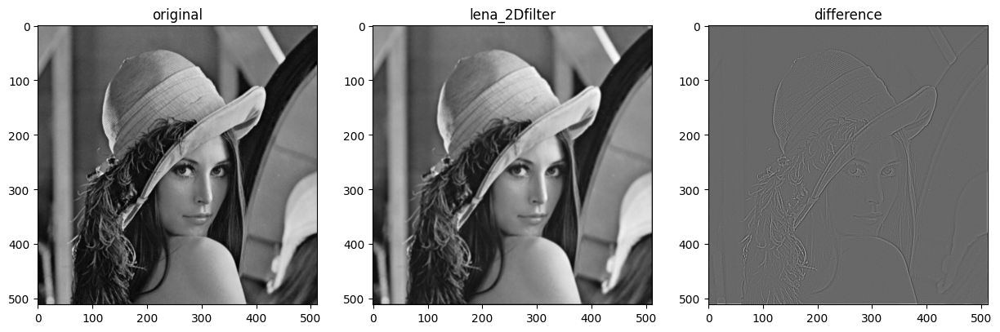

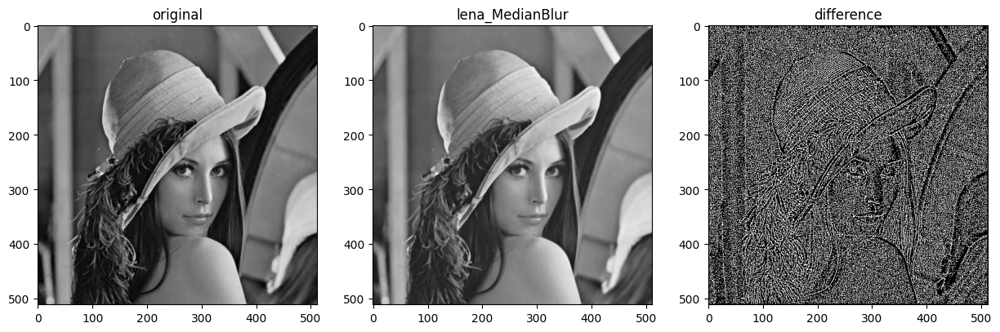

In [ ]:
lena = cv2.imread("lena.png", cv2.IMREAD_GRAYSCALE)

# Average filtering
lena_2DFilter = signal.convolve2d(lena, np.ones((3, 3)) / 9, mode="same")
fig, axs = plt.subplots(1, 3, figsize=(15, 15))
axs[0].imshow(lena, "gray")
axs[0].set_title("original")
axs[1].imshow(lena_2DFilter, "gray")
axs[1].set_title("lena_2Dfilter")
axs[2].imshow(lena - lena_2DFilter, "gray")
axs[2].set_title("difference")

# Median Blur
lena_MedianBlur = signal.medfilt2d(lena, kernel_size=3)
fig, axs = plt.subplots(1, 3, figsize=(15, 15))
axs[0].imshow(lena, "gray")
axs[0].set_title("original")
axs[1].imshow(lena_MedianBlur, "gray")
axs[1].set_title("lena_MedianBlur")
axs[2].imshow(lena - lena_MedianBlur, "gray")
axs[2].set_title("difference")

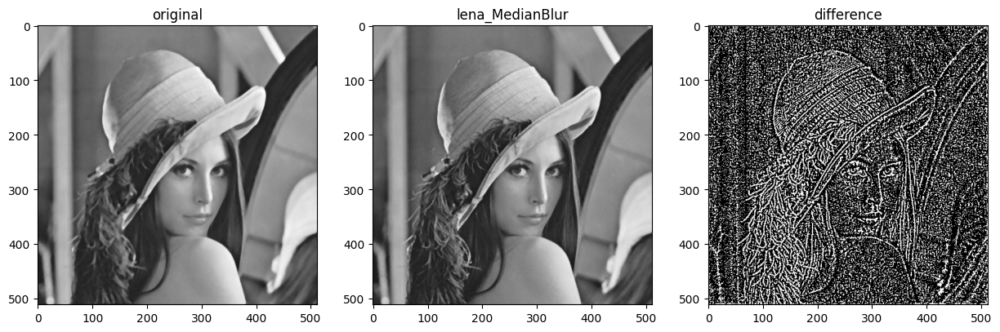

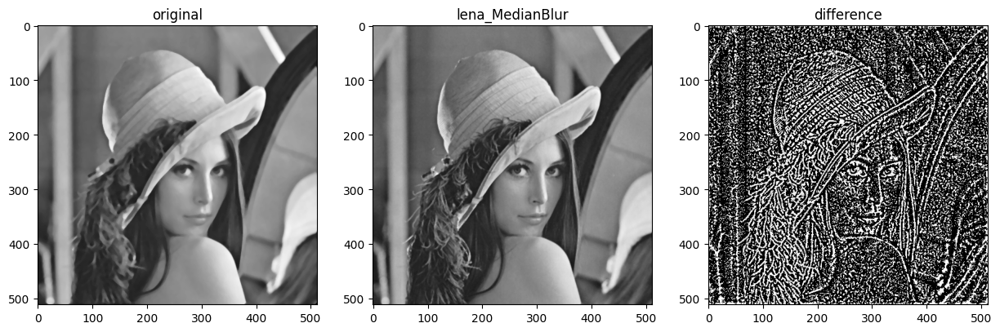

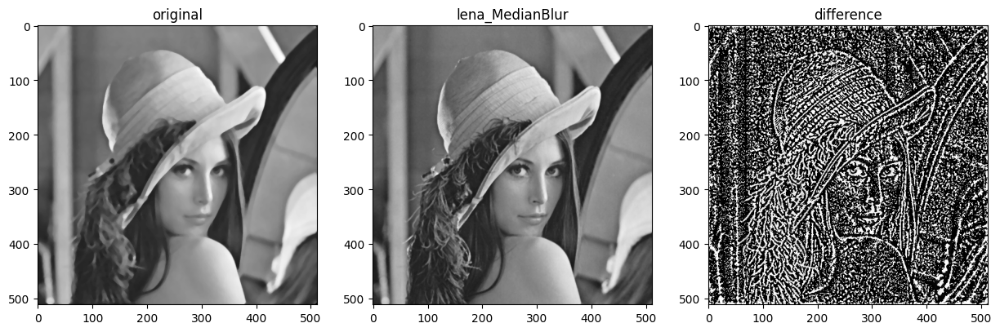

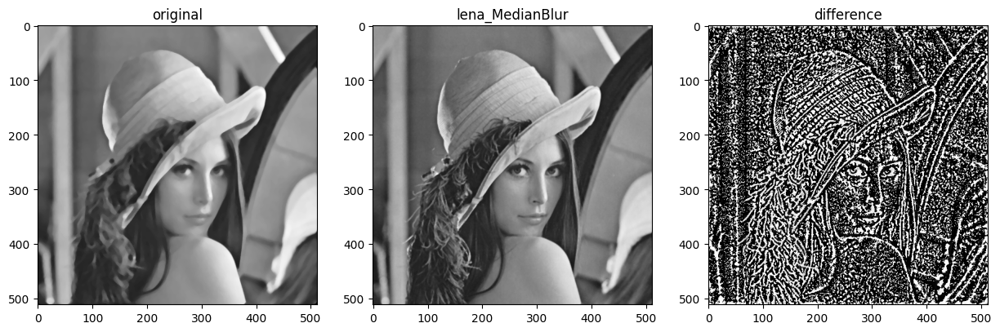

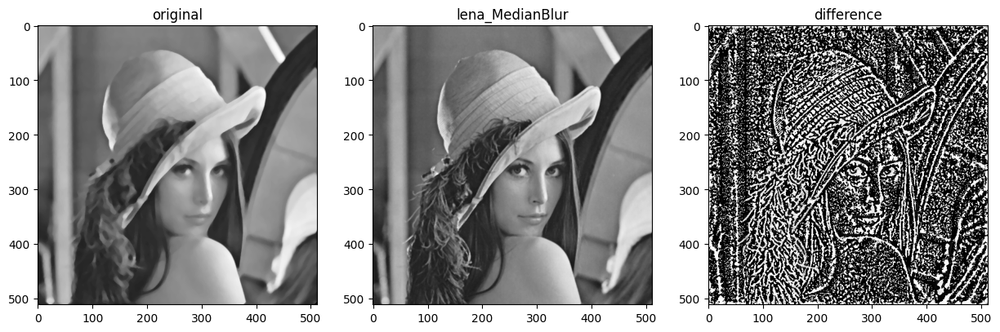

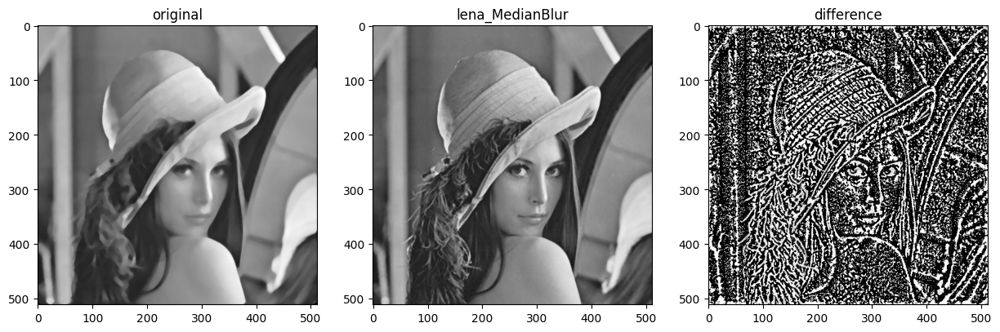

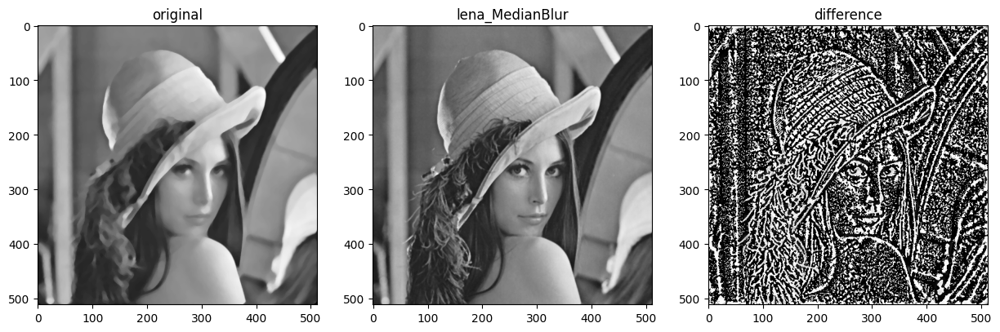

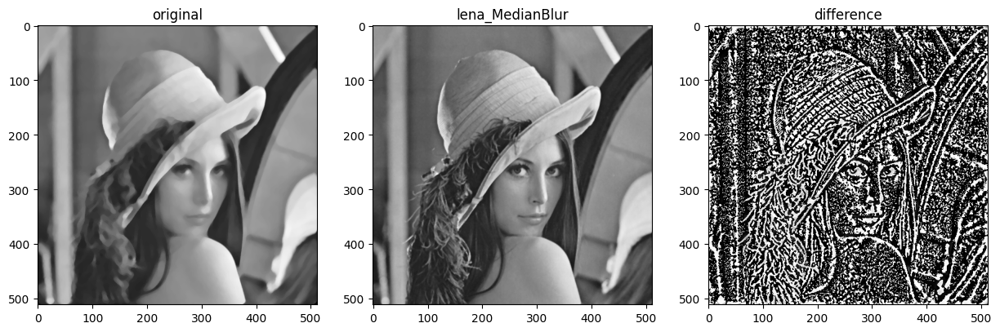

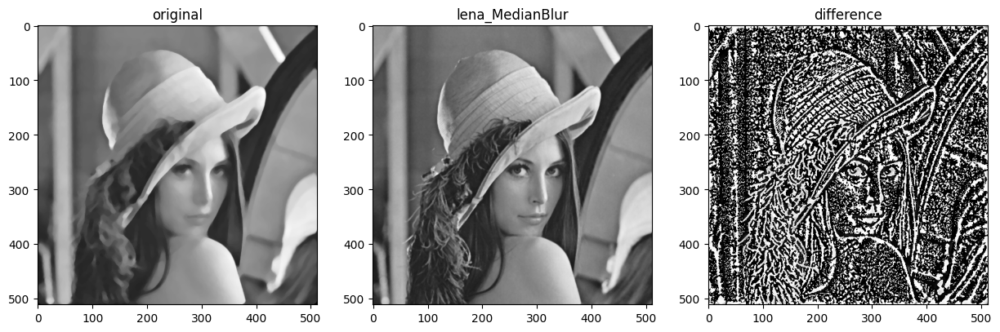

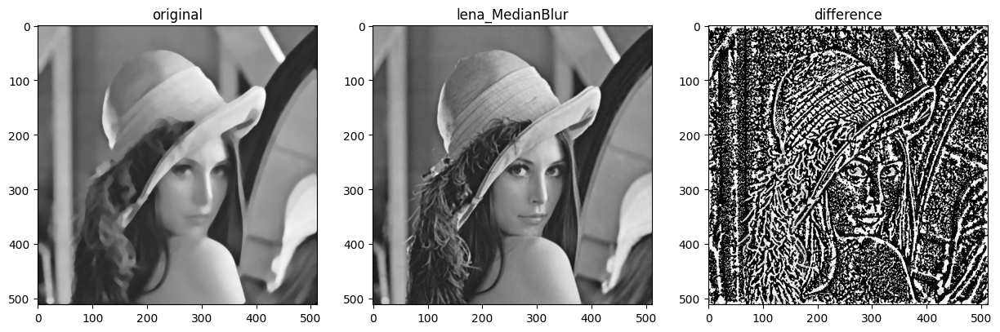

In [ ]:
lena = cv2.imread("lena.png", cv2.IMREAD_GRAYSCALE)
# Iterative median blur
for i in range(10):
    lena = signal.medfilt2d(lena, kernel_size=5)
    fig, axs = plt.subplots(1, 3, figsize=(15, 15))
    axs[0].imshow(lena, "gray")
    axs[0].set_title("original")
    axs[1].imshow(lena_MedianBlur, "gray")
    axs[1].set_title("lena_MedianBlur")
    axs[2].imshow(lena - lena_MedianBlur, "gray")
    axs[2].set_title("difference")

## Filtry liniowe górnoprzepustowe (wyostrzające, wykrywające krawędzie)

Zadaniem filtrów górnoprzepustowych jest wydobywanie z obrazu składników odpowiedzialnych za szybkie zmiany jasności - konturów, krawędzi, drobnych elementów tekstury.

### Laplasjan (wykorzystanie drugiej pochodnej obrazu)

1. Wczytaj obraz _moon.png_.

2. Wprowadź podstawową maskę laplasjanu:
\begin{equation}
M =
\begin{bmatrix}
0 & 1& 0 \\ 1 & -4 & 1 \\ 0 & 1 & 0
\end{bmatrix}
\end{equation}

3. Przed rozpoczęciem obliczeń należy dokonać normalizacji maski - dla rozmiaru $3 \times 3$ podzielić każdy element przez 9.
   Proszę zwrócić uwagę, że nie można tu zastosować takiej samej normalizacji, jak dla filtrów dolnoprzepustowanych, gdyż skutkowałby to dzieleniem przez 0.

4. Wykonaj konwolucję obrazu z maską (`c2.filter2D`). Przed wyświetleniem, wynikowy obraz należy poddać normalizacji (występują ujemne wartości). Najczęściej wykonuje się jedną z dwóch operacji:
- skalowanie (np. poprzez dodatnie 128 do każdego z pikseli),
- moduł (wartość bezwzględna).

Wykonaj obie normalizacje.
Na wspólnym wykresie wyświetl obraz oryginalny oraz przefiltrowany po obu normalizacjach.

Text(0.5, 1.0, 'moon_lepsian_abs')

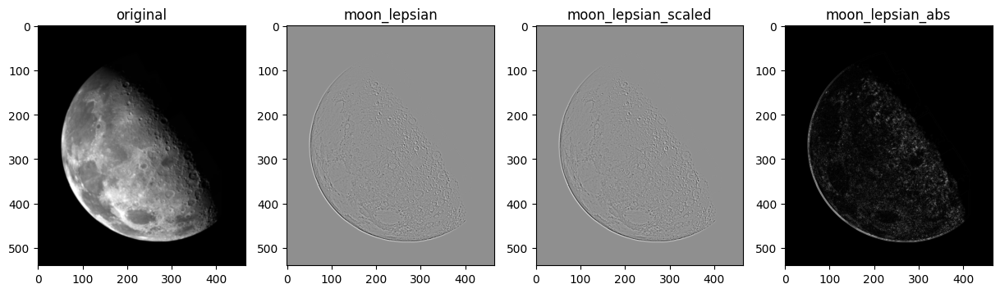

In [ ]:
moon = cv2.imread("moon.png", cv2.IMREAD_GRAYSCALE).astype("int16")
lepsian_mask = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]]) / 9
moon_lepsian = signal.convolve2d(moon, lepsian_mask, mode="same")


moon_lepsian_scaled = (moon_lepsian - np.min(moon_lepsian)) / (
    np.max(moon_lepsian) - np.min(moon_lepsian)
)


moon_lepsian_abs = np.abs(moon_lepsian)

fig, axs = plt.subplots(1, 4, figsize=(15, 15))
axs[0].imshow(moon, "gray")
axs[0].set_title("original")
axs[1].imshow(moon_lepsian, "gray")
axs[1].set_title("moon_lepsian")
axs[2].imshow(moon_lepsian_scaled, "gray")
axs[2].set_title("moon_lepsian_scaled")
axs[3].imshow(moon_lepsian_abs, "gray")
axs[3].set_title("moon_lepsian_abs")

Obserwacje z wykresu:
Obraz oryginalny (lewy panel):

Przedstawia wyjściowy obraz księżyca, zróżnicowany pod względem jasności i kontrastu.

moon_lepsian (środkowy lewy panel):
Wynik działania maski Laplasjanowej. Uwypuklone zostały zmiany intensywności, czyli głównie krawędzie i struktury o wysokich częstotliwościach.

moon_lepsian_scaled (środkowy prawy panel):
To samo co powyżej, ale po przeskalowaniu wartości pikseli, co czyni wynik bardziej wyraźnym i estetycznym. Dzięki temu cała dynamika zmienności zostaje rozciągnięta.

moon_lepsian_abs (prawy panel):
Przekształcenie do wartości bezwzględnych pozwala na lepszą wizualizację wszystkich krawędzi, niezależnie od znaku zmian intensywności.

7. Efekt wyostrzenia uzyskuje się po odjęciu/dodaniu (zależy do maski) rezultatu filtracji laplasjanowej i oryginalnego obrazu. Wyświetl na jednym wykresie: obraz oryginalny, sumę oryginału i wyniku filtracji oraz różnicę (bezwzględną) oryginału i wyniku filtracji.
 Uwaga. Aby uniknąć artefaktów, należy obraz wejściowy przekonwertować do formatu ze znakiem.



Text(0.5, 1.0, 'abs(moon - moon_lepsian_abs)')

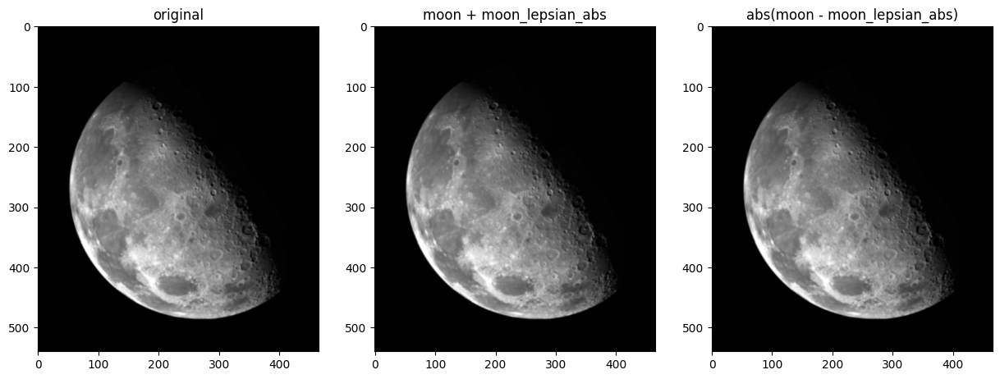

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(15, 15))
axs[0].imshow(moon, "gray")
axs[0].set_title("original")
axs[1].imshow(moon + moon_lepsian_abs, "gray")
axs[1].set_title("moon + moon_lepsian_abs")
axs[2].imshow(np.abs(moon - moon_lepsian_abs), "gray")
axs[2].set_title("abs(moon - moon_lepsian_abs)")

### Gradienty (wykorzystanie pierwszej pochodnej obrazu)

1. Wczytaj obraz _kw.png_. Stwórz odpowiednie maski opisane w kolejnych punktach i dokonaj filtracji.
2. Wykorzystując gradient Robertsa przeprowadź detekcję krawędzi - poprzez wykonanie konwolucji obrazu z daną maską:
\begin{equation}
R1 = \begin{bmatrix} 0 & 0 & 0 \\ -1 & 0 & 0 \\ 0 & 1 & 0 \end{bmatrix}   
R2 = \begin{bmatrix} 0 & 0 & 0 \\ 0 & 0 & -1 \\ 0 & 1 & 0 \end{bmatrix}
\end{equation}

Wykorzystaj stworzony wcześniej kod (przy laplasjanie) - dwie metody normalizacji oraz sposób wyświetlania.

3. Analogicznie przeprowadź detekcję krawędzi za pomocą gradientu Prewitta (pionowy i poziomy)
\begin{equation}
P1 = \begin{bmatrix} -1 & 0 & 1 \\ -1 & 0 & 1 \\ -1 & 0 & 1 \end{bmatrix}   
P2 = \begin{bmatrix} -1 & -1 & -1 \\ 0 & 0 & 0 \\ 1 & 1 & 1 \end{bmatrix}
\end{equation}

4. Podobnie skonstruowany jest gradient Sobela (występuje osiem masek, zaprezentowane są dwie ``prostopadłe''):
\begin{equation}
S1 = \begin{bmatrix} -1 & 0 & 1 \\ -2 & 0 & 2 \\ -1 & 0 & 1 \end{bmatrix}   
S2 = \begin{bmatrix} -1 & -2 & -1 \\ 0 & 0 & 0 \\ 1 & 2 & 1 \end{bmatrix}
\end{equation}

Przeprowadź detekcję krawędzi za pomocą gradientu Sobela.

In [ ]:
def edgeDetection(image: np.ndarray, mask: np.ndarray) -> None:
    # Przeprowadzenie operacji konwolucji na obrazie za pomocą podanej maski
    image_R = signal.convolve2d(image, mask, mode="same")

    # Normalizacja wyniku konwolucji w zakresie [0, 1]
    image_normalized_lapsian_scaled = (image_R - np.min(image_R)) / (np.max(image_R) - np.min(image_R))

    # Obliczenie wartości bezwzględnych wyniku konwolucji (detekcja krawędzi)
    image_normalized_lapsian_abs = np.abs(image_R)

    # Tworzenie wykresów w jednym wierszu
    fig, axs = plt.subplots(1, 4, figsize=(15, 15))

    # Wyświetlenie oryginalnego obrazu
    axs[0].imshow(image, "gray")
    axs[0].set_title("original")

    # Wyświetlenie obrazu po operacji konwolucji
    axs[1].imshow(image_R, "gray")
    axs[1].set_title("image_R")

    # Wyświetlenie obrazu po normalizacji wyników konwolucji (skalowanie)
    axs[2].imshow(image_normalized_lapsian_scaled, "gray")
    axs[2].set_title("image_normalized_lapsian_scaled")

    # Wyświetlenie obrazu z wartościami bezwzględnymi wyników konwolucji
    axs[3].imshow(image_normalized_lapsian_abs, "gray")
    axs[3].set_title("image_normalized_lapsian_abs")


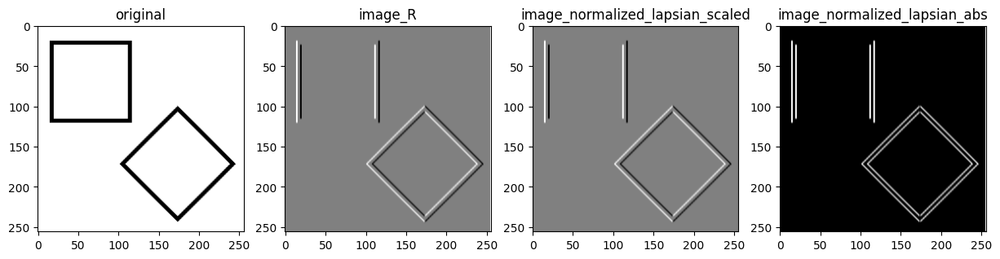

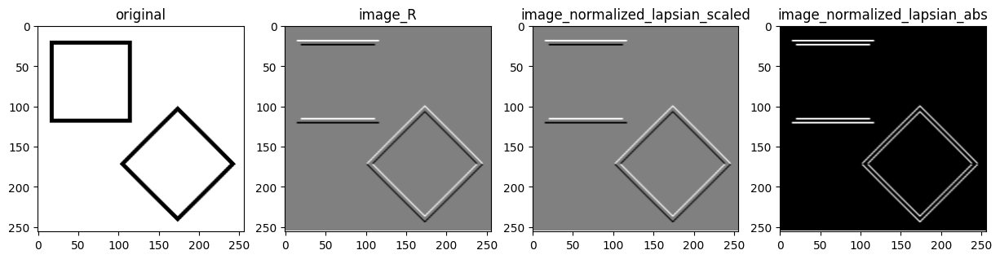

In [ ]:
kw = cv2.imread("kw.png", cv2.IMREAD_GRAYSCALE)
R1 = np.array([[0, 0, 0], [-1, 1, 0], [0, 0, 0]])
R2 = np.array([[0, 0, 0], [0, 0, -1], [0, 1, 0]])
P1 = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
P2 = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]])

S1 = np.array([[-1, 0, 1],
               [-2, 0, 2],
               [-1, 0, 1]])

S2 = np.array([[-1, -2, -1],
                [0, 0, 0],
                [1, 2, 1]])


edgeDetection(kw, S1)
edgeDetection(kw, S2)

5. Na podstawie dwóch ortogonalnych masek np. Sobela można stworzyć tzw. filtr kombinowany - pierwiastek kwadratowy z sumy kwadratów gradientów:
\begin{equation}
OW = \sqrt{(O * S1)^2 + (O * S2)^2}
\end{equation}
gdzie:  $OW$ - obraz wyjściowy, $O$ - obraz oryginalny (wejściowy), $S1,S2$ - maski Sobela, $*$ - operacja konwolucji.

Zaimplementuj filtr kombinowany.

Uwaga. Proszę zwrócić uwagę na konieczność zmiany formatu danych obrazu wejściowego - na typ znakiem



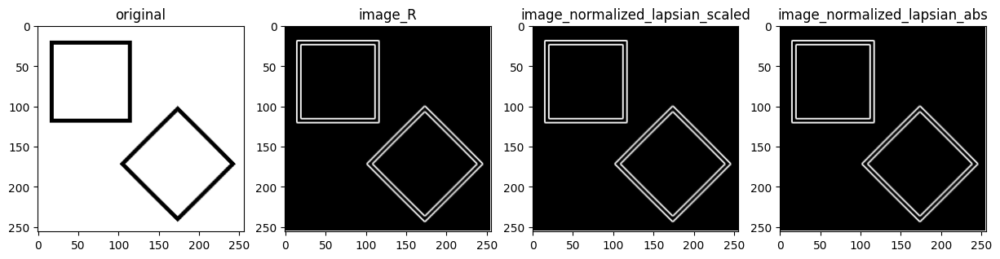

In [ ]:
def edgeDetectionComb(image: np.ndarray, mask1: np.ndarray, mask2: np.ndarray):
    image_1 = signal.convolve2d(image, mask1, mode="same")
    image_2 = signal.convolve2d(image, mask2, mode="same")
    img_comb = np.sqrt(image_1**2 + image_2**2)

    image_normalized_lapsian_scaled = (img_comb - np.min(img_comb)) / (np.max(img_comb) - np.min(img_comb))
    image_normalized_lapsian_abs = np.abs(img_comb)

    fig, axs = plt.subplots(1, 4, figsize=(15, 15))
    axs[0].imshow(image, "gray")
    axs[0].set_title("original")
    axs[1].imshow(img_comb, "gray")
    axs[1].set_title("image_R")
    axs[2].imshow(image_normalized_lapsian_scaled, "gray")
    axs[2].set_title("image_normalized_lapsian_scaled")
    axs[3].imshow(image_normalized_lapsian_abs, "gray")
    axs[3].set_title("image_normalized_lapsian_abs")

edgeDetectionComb(kw, S1, S2)

6. Istnieje alternatywna wersja filtra kombinowanego, która zamiast pierwiastka z sumy kwadratów wykorzystuje sumę modułów (prostsze obliczenia).
Zaimplementuj tę wersję.

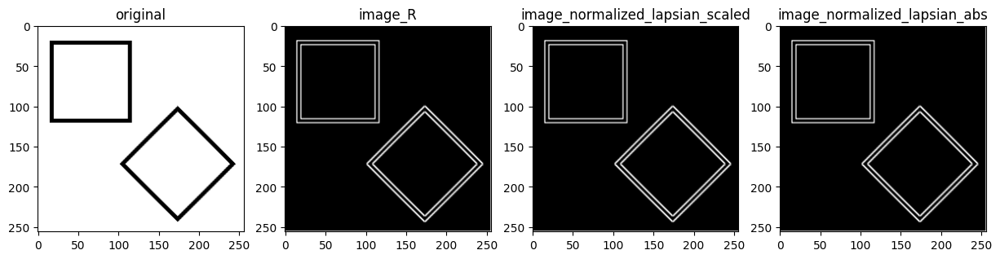

In [ ]:
def edgeDetectionCombSimplified(image: np.ndarray, mask1: np.ndarray, mask2: np.ndarray) -> None:
    image_1 = signal.convolve2d(image, mask1, mode="same")
    image_2 = signal.convolve2d(image, mask2, mode="same")
    img_comb = np.abs(image_1) + np.abs(image_2)
    image_normalized_lapsian_scaled = (img_comb - np.min(img_comb)) / (np.max(img_comb) - np.min(img_comb))
    image_normalized_lapsian_abs = np.abs(img_comb)

    fig, axs = plt.subplots(1, 4, figsize=(15, 15))
    axs[0].imshow(image, "gray")
    axs[0].set_title("original")
    axs[1].imshow(img_comb, "gray")
    axs[1].set_title("image_R")
    axs[2].imshow(image_normalized_lapsian_scaled, "gray")
    axs[2].set_title("image_normalized_lapsian_scaled")
    axs[3].imshow(image_normalized_lapsian_abs, "gray")
    axs[3].set_title("image_normalized_lapsian_abs")


edgeDetectionCombSimplified(kw, S1, S2)

7. Wczytaj plik _jet.png_ (zamiast _kw.png_).
Sprawdź działanie obu wariantów filtracji kombinowanej.

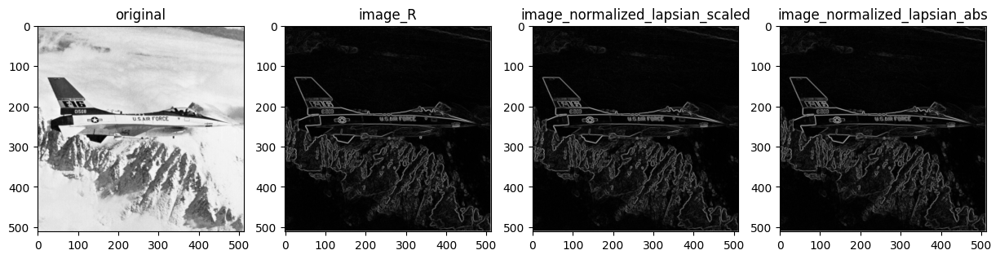

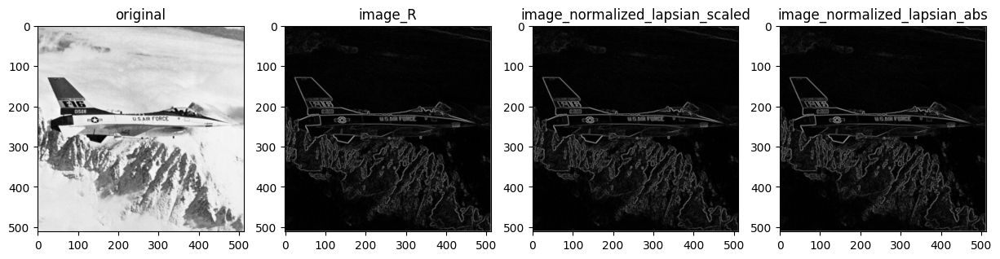

In [ ]:
jet = cv2.imread("jet.png", cv2.IMREAD_GRAYSCALE)
edgeDetectionComb(jet, S1, S2)
edgeDetectionCombSimplified(jet, S1, S2)
